<a href="https://colab.research.google.com/github/grompere/whichplant/blob/main/Training_prototype.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [ ]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
import os
key = os.environ.get('AZURE_SEARCH_KEY', 'a8c12f7e3ea541e4bf77c8dbcae5526c')

In [ ]:
plant_types = 'Air plant','Indoor cactus', 'Money plant', 'Succulent', 'Spider plant', 'Snake plant', 'Prayer plant', 'Aloe vera plant indoor', 'Monstera plant', 'Basil plant indoor', 'Umbrella tree indoor', 'Dracanea fragans'
path = Path('gdrive/MyDrive/whichplant/plants')

In [ ]:
if not path.exists():
    path.mkdir()
    for o in plant_types:
        dest = (path/o)
        print(dest)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [ ]:
fns = get_image_files(path)
fns

(#1653) [Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000015.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000020.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000021.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000000.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000011.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000010.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000005.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000012.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000001.jpg'),Path('gdrive/MyDrive/whichplant/plants/Snake plant/00000003.jpg')...]

In [ ]:
#failed = verify_images(fns)
#failed

Process ForkProcess-3:
Traceback (most recent call last):
  File "/usr/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/usr/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.7/concurrent/futures/process.py", line 233, in _process_worker
    call_item = call_queue.get(block=True)
  File "/usr/lib/python3.7/multiprocessing/queues.py", line 113, in get
    return _ForkingPickler.loads(res)
  File "/usr/lib/python3.7/multiprocessing/managers.py", line 943, in RebuildProxy
    return func(token, serializer, incref=incref, **kwds)
  File "/usr/lib/python3.7/multiprocessing/managers.py", line 793, in __init__
    self._incref()
  File "/usr/lib/python3.7/multiprocessing/managers.py", line 847, in _incref
    conn = self._Client(self._token.address, authkey=self._authkey)
  File "/usr/lib/python3.7/multiprocessing/connection.py", line 492, in Client
    c = SocketClient(add

KeyboardInterrupt: ignored

In [ ]:
#failed.map(Path.unlink);

In [ ]:
plants = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
dls = plants.dataloaders(path)

In [ ]:
plants = plants.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = plants.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,2.745376,0.977823,0.298137,01:34


epoch,train_loss,valid_loss,error_rate,time
0,1.022616,0.673533,0.214286,01:34
1,0.774705,0.561318,0.173913,01:35
2,0.597567,0.504095,0.158385,01:35
3,0.465099,0.479450,0.149068,01:36


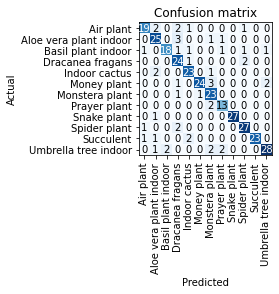

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

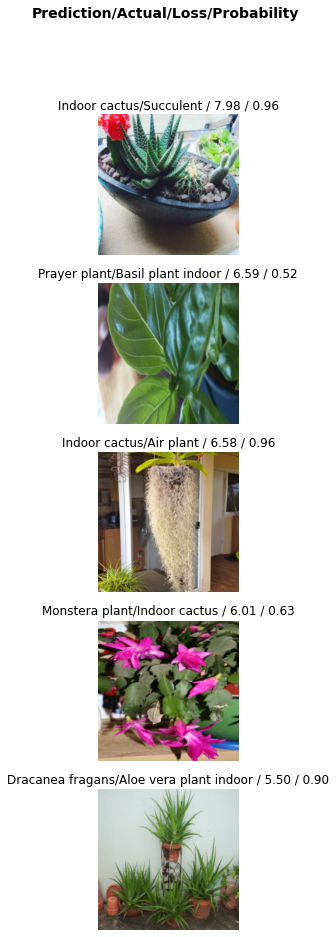

In [ ]:
interp.plot_top_losses(5, nrows=5)

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): print(cleaner.fns[idx])

gdrive/MyDrive/whichplant/plants/Prayer plant/00000076.JPG


In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

### Using the Model for Inference

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.dls.vocab

['Air plant', 'Aloe vera plant indoor', 'Basil plant indoor', 'Dracanea fragans', 'Indoor cactus', 'Money plant', 'Monstera plant', 'Prayer plant', 'Snake plant', 'Spider plant', 'Succulent', 'Umbrella tree indoor']

In [ ]:

learn_inf.predict('gdrive/MyDrive/whichplant/whatisthis2.jpg')

('Umbrella tree indoor',
 TensorBase(11),
 TensorBase([2.0524e-05, 5.6154e-05, 1.5075e-04, 1.2330e-02, 7.5403e-05, 4.0907e-03, 9.7445e-03, 2.5644e-04, 1.1411e-04, 6.7330e-04, 4.2362e-05, 9.7245e-01]))

### Turning Your Notebook into a Real App

In [ ]:

#!pip install voila
#!jupyter serverextension enable --sys-prefix voila 

## Questionnaire

1. Provide an example of where the bear classification model might work poorly in production, due to structural or style differences in the training data.
1. Where do text models currently have a major deficiency?
1. What are possible negative societal implications of text generation models?
1. In situations where a model might make mistakes, and those mistakes could be harmful, what is a good alternative to automating a process?
1. What kind of tabular data is deep learning particularly good at?
1. What's a key downside of directly using a deep learning model for recommendation systems?
1. What are the steps of the Drivetrain Approach?
1. How do the steps of the Drivetrain Approach map to a recommendation system?
1. Create an image recognition model using data you curate, and deploy it on the web.
1. What is `DataLoaders`?
1. What four things do we need to tell fastai to create `DataLoaders`?
1. What does the `splitter` parameter to `DataBlock` do?
1. How do we ensure a random split always gives the same validation set?
1. What letters are often used to signify the independent and dependent variables?
1. What's the difference between the crop, pad, and squish resize approaches? When might you choose one over the others?
1. What is data augmentation? Why is it needed?
1. What is the difference between `item_tfms` and `batch_tfms`?
1. What is a confusion matrix?
1. What does `export` save?
1. What is it called when we use a model for getting predictions, instead of training?
1. What are IPython widgets?
1. When might you want to use CPU for deployment? When might GPU be better?
1. What are the downsides of deploying your app to a server, instead of to a client (or edge) device such as a phone or PC?
1. What are three examples of problems that could occur when rolling out a bear warning system in practice?
1. What is "out-of-domain data"?
1. What is "domain shift"?
1. What are the three steps in the deployment process?

### Further Research

1. Consider how the Drivetrain Approach maps to a project or problem you're interested in.
1. When might it be best to avoid certain types of data augmentation?
1. For a project you're interested in applying deep learning to, consider the thought experiment "What would happen if it went really, really well?"
1. Start a blog, and write your first blog post. For instance, write about what you think deep learning might be useful for in a domain you're interested in.